In [37]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import numpy as np
import umap
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.mixture import GaussianMixture
from sklearn.feature_selection import SelectKBest, f_classif
import pylab
import scipy
import sklearn
import time
import seaborn as sns
from mpl_toolkits import mplot3d 
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
from sklearn.metrics import silhouette_score # (X, labels, *, metric='euclidean', sample_size=None, random_state=None, **kwds)

In [2]:
pd.set_option("display.max_rows", 250000)

In [3]:
df = pd.read_csv('/Users/robholmstrom/OneDrive/Gitrepos/nonrepo_files/GSE59114.csv', header = 1)
df1 = df.T
df1.columns = df1.loc['Gene Symbol'].reset_index()
df1 = df1.drop(['Gene Symbol', 'UCSC transcripts'])
df1.columns = [x[1] for x in df1.columns]
df1.columns = df1.columns.str.replace("'", "")
df1.shape

(1434, 8422)

Itgam, Ly6g, Ptprc, Cd3e, Ly76, Kit, Ly6a, Cd48, Slamf1

In [4]:
import re
df1_1 = df1[~df1.index.str.contains('biol_replicate')]
df1_1 = df1_1.drop(['\'Young LT-HSC\'','\'Young ST-HSC\'', '\'Young MPP\'','\'Old LT-HSC\'', '\'Old ST-HSC\'','Old MPP\''])
df1_1 = df1_1.drop(['Itgam', 'Ptprc', 'Kit', 'Ly6a', 'Cd48', 'Slamf1'], axis = 1)

In [5]:
df1_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1058 entries, young_LT_HSC_2 to old_MPP_168
Columns: 8416 entries, Npl to Sft2d1
dtypes: object(8416)
memory usage: 67.9+ MB


In [6]:
df1_1.index = df1_1.index.str.replace(r'[^a-zA-Z]', '')

print((df1_1.columns).shape)
print(np.unique(df1_1.columns).shape)

(8416,)
(8351,)


In [7]:
df1_1dup = df1_1[df1_1.loc[:,df1_1.columns.duplicated()].columns]


In [8]:
dupcols = np.unique(df1_1dup.columns)
dupcols

array(['Abcg2', 'Arih1', 'Atf7ip', 'Atrip', 'Brwd1', 'Cbx1', 'Ccnd3',
       'Cdk6', 'Celf1', 'Commd1', 'Csnk1a1', 'Ctse', 'Dnajb6', 'Eci2',
       'Eif1ax', 'Fgd4', 'Fus', 'G3bp1', 'Glod4', 'Gm10598', 'Gm13215',
       'Hjurp', 'Ikbkb', 'Ing4', 'Itga4', 'Itga6', 'Kansl2', 'Lcor',
       'Lrrc29', 'Luc7l2', 'Mafg', 'Mecom', 'Mob1a', 'Mtcp1', 'Nagk',
       'Ndufa3', 'Pafah1b1', 'Patz1', 'Pcif1', 'Pik3ip1', 'Psme4', 'Pten',
       'Ramp2', 'Rpl24', 'Rspry1', 'Satb1', 'Smarcc2', 'Srcap', 'Srsf10',
       'Sugp2', 'Taf9', 'Tex261', 'Tmem167b', 'Tmem181b-ps', 'Trappc9',
       'Trim30b', 'U2af1l4', 'Utp23', 'Wwp2', 'Zbtb20', 'Zfp708',
       'Zfp869', 'Zgpat'], dtype=object)

In [9]:
df1_1dupgroup = df1_1dup.groupby(df1_1dup.columns, axis=1).sum()

In [10]:
df1_1dupmean = pd.DataFrame()
for x in dupcols:
    df1_1dupmean[x] = df1_1dupgroup[x]/df1_1dup.columns.tolist().count(x)


In [11]:
# cols = []
# n = 1
# for x in df2dup.columns:
#     if x in cols:
#         cols.append(x+'.'+str(n))
#         n += 1
#     else:
#         cols.append(x)
#         n = 1


In [12]:
dfnodup = df1_1.loc[:,~df1_1.columns.duplicated()].drop(dupcols, axis = 1)

df2 = pd.concat([dfnodup, df1_1dupmean], axis = 1)

df2= df2.round(2)
df2.shape

(1058, 8351)

In [13]:
genefracs = (df2==0).sum()/(df2==0).count()
passindex = genefracs[genefracs < 0.20]


In [14]:
genefracs.sort_values()

Rps23                                                                                                 0.000000
Rpl4                                                                                                  0.000000
uc007yyn.2                                                                                            0.000000
Pikfyve                                                                                               0.000000
Eef2                                                                                                  0.000000
Rpl13                                                                                                 0.000000
Rpl32                                                                                                 0.000000
Mmp12                                                                                                 0.000000
Traf5                                                                                                 0.000000
u

In [15]:
zifa = df2[passindex.index]
zifa= np.round(zifa.astype(np.float64),4)
zifa = np.array(zifa)
zifa.shape

(1058, 1052)

In [16]:
from ZIFA import ZIFA
from ZIFA import block_ZIFA

In [17]:
start_time = time.time()
Z, model_params = block_ZIFA.fitModel(zifa, 10)
print("--- %s seconds ---" % (time.time() - start_time))

Filtering out all genes which are zero in more than 95.0% of samples. To change this, change p0_thresh.
Number of blocks has been set to 2
Running block zero-inflated factor analysis with N = 1058, D = 1052, K = 10, n_blocks = 2
Block sizes [526, 526]
Param change below threshold 1.000e-02 after 8 iterations
--- 96.4463791847229 seconds ---


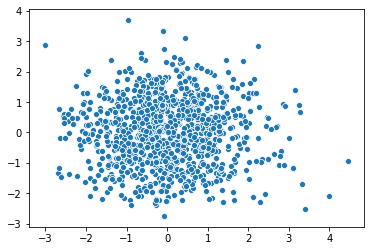

In [18]:
dfz = pd.DataFrame(Z, index = df2.index)
pcaz = PCA(n_components=3, random_state = 42)

zcomps = pcaz.fit_transform(dfz)
sns.scatterplot(zcomps[:,0], zcomps[:,1])
plt.show()

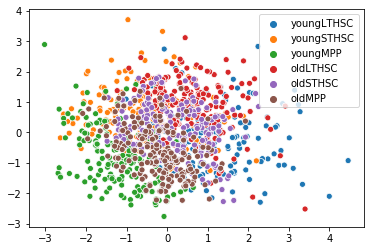

In [19]:
sns.scatterplot(zcomps[:,0], zcomps[:,1], hue = dfz.index)
plt.show()

In [20]:
encoded = {'oldLTHSC':0, 'oldMPP':1, 'oldSTHSC':2, 'youngLTHSC':3, 'youngMPP':4, 'youngSTHSC':5}
cells = ['oldLTHSC' ,'oldMPP', 'oldSTHSC', 'youngLTHSC' ,'youngMPP' ,'youngSTHSC']
cell_types = [encoded.get(x, x) for x in dfz.index]
colormap = ['r', 'b', 'g', 'y', 'c', 'm']
cell_colors = [colormap[x] for x in cell_types]
dfpca = pd.DataFrame(zcomps, index = dfz.index)
dfpca
fig = px.scatter_3d(dfpca, zcomps[:,0], zcomps[:,1],zcomps[:,2], dfpca.index)
fig.update_traces(marker=dict(opacity =1, size=4,
                              line=dict(width= .1)))

fig.show()

In [21]:
np.cov(dfz)

array([[ 1.18381541,  0.7513838 ,  1.11908912, ...,  0.00327091,
         0.04011302, -0.01715696],
       [ 0.7513838 ,  0.97541993,  0.97577272, ..., -0.30185698,
        -0.02848255, -0.50047842],
       [ 1.11908912,  0.97577272,  1.56340973, ..., -0.19414088,
         0.12479642, -0.45749269],
       ...,
       [ 0.00327091, -0.30185698, -0.19414088, ...,  0.32876855,
         0.06032784,  0.40376639],
       [ 0.04011302, -0.02848255,  0.12479642, ...,  0.06032784,
         0.23381668,  0.05229138],
       [-0.01715696, -0.50047842, -0.45749269, ...,  0.40376639,
         0.05229138,  0.7109735 ]])

Text(0.5, 1.0, 'ZIFA-UMAP (10 dim): genes with fewer than 20% zeros')

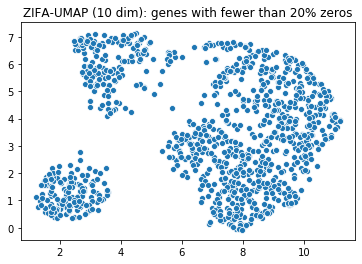

In [22]:
zumap = umap.UMAP(n_neighbors=20,
                      min_dist=.2,
                      metric='euclidean').fit_transform(dfz)
fig = sns.scatterplot(zumap[:,0], zumap[:,1])
fig.set_title('ZIFA-UMAP (10 dim): genes with fewer than 20% zeros')
#fig.legend(loc='center left', bbox_to_anchor=(1, 0.5))

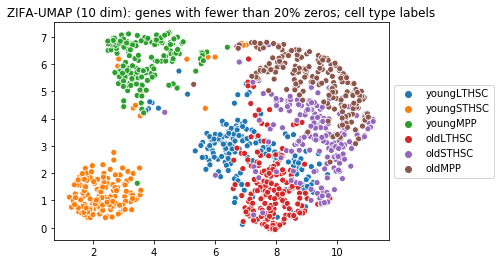

In [23]:
fig = sns.scatterplot(zumap[:,0], zumap[:,1], hue = dfz.index)

fig.set_title('ZIFA-UMAP (10 dim): genes with fewer than 20% zeros; cell type labels')
fig.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [76]:
gmm = GaussianMixture(n_components = 2)
gmm.fit(dfz)
cluster = gmm.fit_predict(dfz)


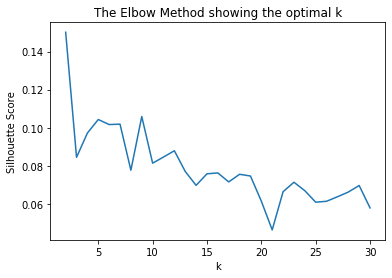

In [77]:
gmmsilhouette = []
K = range(2,31)
for k in K:
    gmm = GaussianMixture(n_components=k)
    gmmsilhouette.append(silhouette_score(dfz, gmm.fit_predict(dfz), metric='euclidean'))

plt.plot(K, gmmsilhouette)
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('The Elbow Method showing the optimal k')
plt.show()


In [86]:
dfz

,0,1,2,3,4,5,6,7,8,9
youngLTHSC,-0.483992,-0.162592,-0.225457,-1.382496,2.085100,1.614868,1.043621,-0.024021,-0.720142,-0.284609
youngLTHSC,-1.048942,0.820639,-0.102788,-0.020514,1.694543,1.178026,1.237749,-0.641783,-0.700577,1.295280
youngLTHSC,-1.573383,-0.503760,0.677358,-0.035930,2.410256,1.947060,0.757660,-0.409620,-1.040131,0.145037
youngLTHSC,-0.219870,-0.181691,0.245958,0.940014,3.889430,2.961986,-0.626112,0.747068,-2.695228,-0.515255
youngLTHSC,0.350174,-0.361705,-0.580150,-0.911757,3.415859,4.174581,0.755805,0.550478,-1.534040,-0.220402
youngLTHSC,-0.411382,-0.508201,-0.470208,0.789364,0.875735,0.905956,1.148942,-0.328669,-0.127233,-0.139342
youngLTHSC,-1.372056,0.020144,0.502000,0.380122,1.413137,-1.244026,1.453578,-0.440477,-1.396369,-0.268509
youngLTHSC,-1.406670,0.251679,-0.321752,0.495556,0.488086,0.336278,0.369270,-0.829309,-0.637440,0.815458
youngLTHSC,0.087844,1.030044,-0.606924,1.502226,0.320179,0.881261,0.195829,-1.166249,-1.334772,0.278010
youngLTHSC,0.106748,-0.406607,0.158395,3.320946,-0.422062,1.180974,0.947592,-1.874390,-0.540792,1.036454


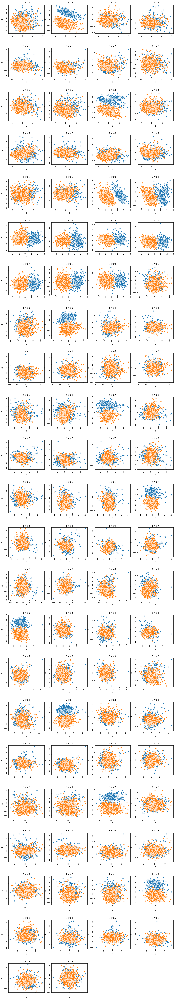

In [92]:
x = 1
fig = plt.figure(figsize = (15,100))
for i in range(10):
    for j in range(10):
        if i == j:
            pass
        else:
            plt.subplot(25,4,x)
        
            fig.subplots_adjust(hspace=.5, wspace=.2)
            plt.title(f'{i} vs {j}')
            sns.scatterplot(dfz[i], dfz[j], hue = cluster, legend = False)
            x += 1

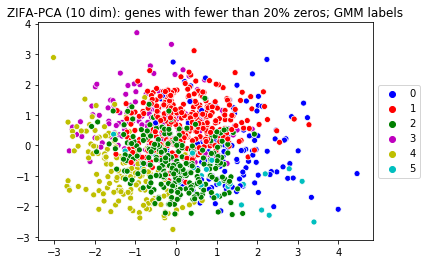

In [25]:
fig = sns.scatterplot(zcomps[:,0], zcomps[:,1], hue = cluster, palette =['b', 'r', 'g', 'm', 'y', 'c'])
fig.set_title('ZIFA-PCA (10 dim): genes with fewer than 20% zeros; GMM labels')
fig.legend(loc='center left', bbox_to_anchor=(1, 0.5))

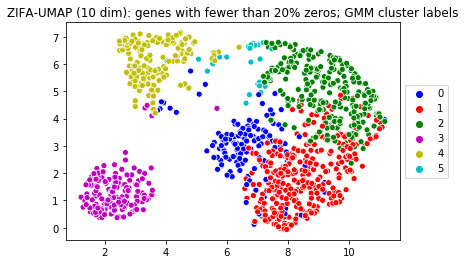

In [26]:
fig = sns.scatterplot(zumap[:,0], zumap[:,1], hue = cluster, palette =['b', 'r', 'g', 'm', 'y', 'c'])
fig.set_title('ZIFA-UMAP (10 dim): genes with fewer than 20% zeros; GMM cluster labels')
fig.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [68]:
km = KMeans(n_clusters = 2, random_state=42)
kmdata = km.fit_transform(dfz)
kpred = km.fit_predict(dfz)

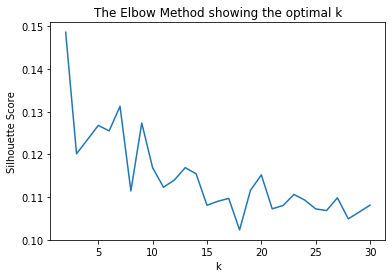

In [71]:
kmsilhouette = []
K = range(2,31)
for k in K:
    km = KMeans(n_clusters=k)
    kmsilhouette.append(silhouette_score(dfz, km.fit_predict(dfz), metric='euclidean'))

plt.plot(K, kmsilhouette)
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('The Elbow Method showing the optimal k')
plt.show()


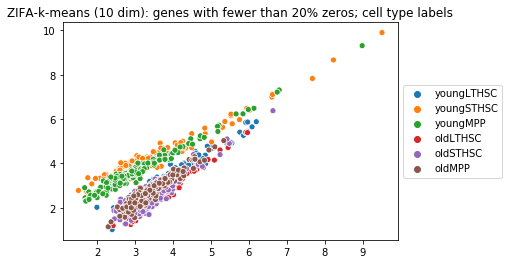

In [69]:
fig = sns.scatterplot(kmdata[:,0], kmdata[:,1], hue = dfz.index)
fig.set_title('ZIFA-k-means (10 dim): genes with fewer than 20% zeros; cell type labels')
fig.legend(loc='center left', bbox_to_anchor=(1, 0.5))

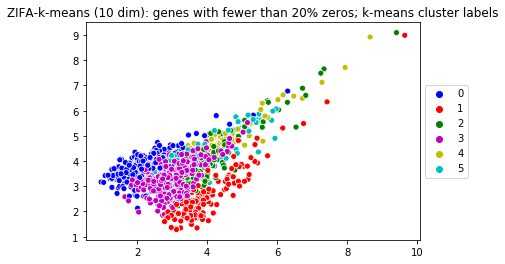

In [29]:
fig = sns.scatterplot(kmdata[:,0], kmdata[:, 1], hue = kpred, palette =['b', 'r', 'g', 'm', 'y', 'c'])
fig.set_title('ZIFA-k-means (10 dim): genes with fewer than 20% zeros; k-means cluster labels')
fig.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [30]:
pd.crosstab(dfz.index, kpred)

col_0,0,1,2,3,4,5
row_0,,,,,,
oldLTHSC,161,8,0,3,0,11
oldMPP,0,63,0,124,0,1
oldSTHSC,27,7,1,142,0,12
youngLTHSC,71,7,6,4,0,79
youngMPP,0,42,124,0,1,1
youngSTHSC,0,6,10,0,143,4


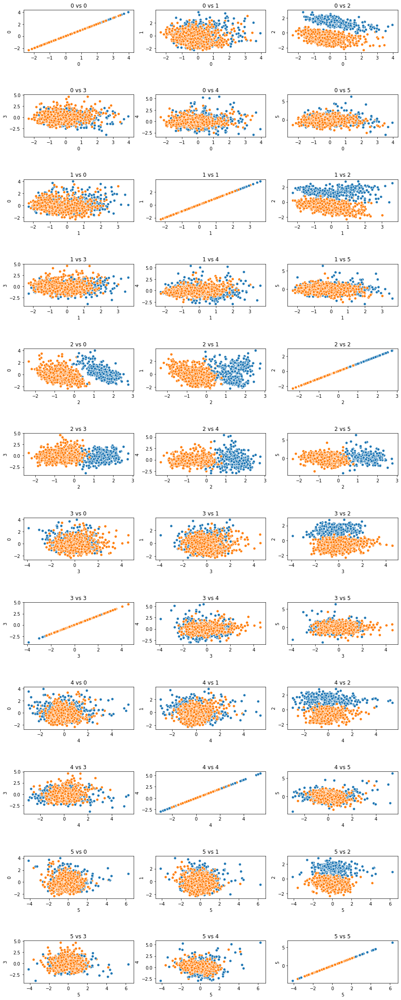

In [72]:
x = 1
fig = plt.figure(figsize = (15,40))
for i in range(6):
    for j in range(6):
        plt.subplot(12,3,x)
        
        fig.subplots_adjust(hspace=1, wspace=.2)
        plt.title(f'{i} vs {j}')
        sns.scatterplot(dfz[i], dfz[j], hue = kpred, legend = False)
        x += 1

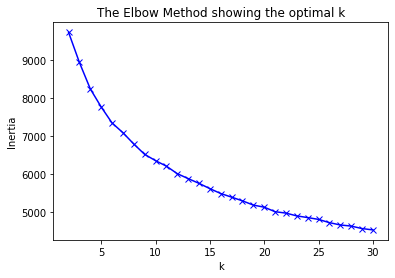

In [43]:
inertia = []
K = range(2,31)
for k in K:
    km = KMeans(n_clusters=k).fit(dfz)
    inertia.append(km.inertia_)

plt.plot(K, inertia, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('The Elbow Method showing the optimal k')
plt.show()

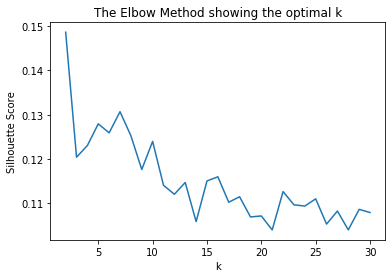

In [44]:
silhouette = []
K = range(2,31)
for k in K:
    km = KMeans(n_clusters=k)
    silhouette.append(silhouette_score(dfz, km.fit_predict(dfz), metric='euclidean'))

plt.plot(K, silhouette)
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('The Elbow Method showing the optimal k')
plt.show()


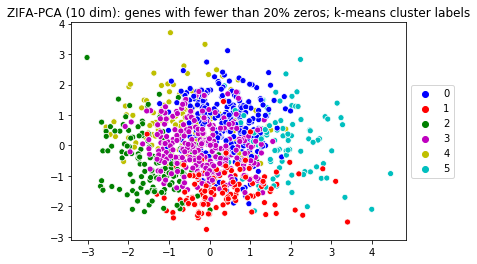

In [42]:
fig = sns.scatterplot(zcomps[:,0], zcomps[:,1], hue = kpred, palette =['b', 'r', 'g', 'm', 'y', 'c'])
fig.set_title('ZIFA-PCA (10 dim): genes with fewer than 20% zeros; k-means cluster labels')
fig.legend(loc='center left', bbox_to_anchor=(1, 0.5))

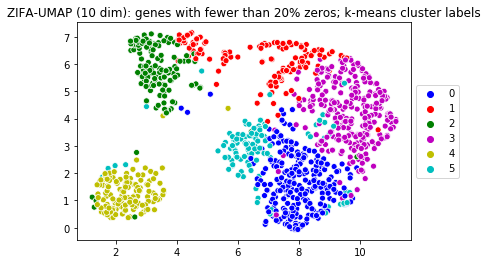

In [32]:
fig = sns.scatterplot(zumap[:,0], zumap[:,1], hue = kpred, palette =['b', 'r', 'g', 'm', 'y', 'c'])
fig.set_title('ZIFA-UMAP (10 dim): genes with fewer than 20% zeros; k-means cluster labels')
fig.legend(loc='center left', bbox_to_anchor=(1, 0.5))

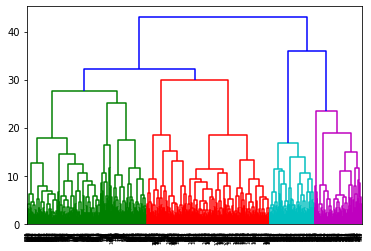

In [33]:
dendrogram(linkage(dfz, method = 'ward'))
plt.show()

In [34]:
dfcelltypes = pd.DataFrame(df2.mean(), columns = ['All cell average'])
dfcelltypes['youngLTHSC'] = df2[df2.index == 'youngLTHSC'].mean()
dfcelltypes['youngSTHSC'] = df2[df2.index == 'youngSTHSC'].mean()
dfcelltypes['youngMPP'] = df2[df2.index == 'youngMPP'].mean()
dfcelltypes['oldLTHSC'] = df2[df2.index == 'oldLTHSC'].mean()
dfcelltypes['oldSTHSC'] = df2[df2.index == 'oldSTHSC'].mean()
dfcelltypes['oldMPP'] = df2[df2.index == 'oldMPP'].mean()


In [35]:
dfcellbroad = pd.DataFrame(df2.mean(), columns = ['All cell average'])
dfcellbroad['HSC'] = df2[df2.index.str.contains('HSC')].mean()
dfcellbroad['MPP'] = df2[df2.index.str.contains('MPP')].mean()
dfcellbroad['HSC/MPP'] = dfcellbroad['HSC']/dfcellbroad['MPP']
dfcellbroad.sort_values(by = ['HSC/MPP','HSC','MPP'], ascending = False).head(25000)


,All cell average,HSC,MPP,HSC/MPP
Efna1,0.643544,0.969900,0.000000,inf
Epor,0.195877,0.295211,0.000000,inf
A230065H16Rik,0.188853,0.284625,0.000000,inf
Entpd2,0.118546,0.178663,0.000000,inf
uc012bnh.1,0.012621,0.019021,0.000000,inf
Chst2,0.390360,0.586061,0.004454,131.566650
Tenc1,0.414738,0.620018,0.009946,62.336291
Sytl5,0.261054,0.390131,0.006526,59.776644
Smtnl1,0.344110,0.513502,0.010084,50.924486
Fkbp10,0.207363,0.307573,0.009758,31.520597
